# Imports

In [11]:
from matplotlib.colors import LogNorm
from numba import cfunc, vectorize
from numba.types import intc, CPointer, float64
import numpy as np
import os
import pickle
from scipy import LowLevelCallable
from scipy.integrate import quad
from scipy.optimize import minimize_scalar
from scipy.interpolate import griddata
import itertools

from background_models import bg_dampe
from constants import plot_obs, dampe_es, dampe_excess_iflux, fermi_psf
from constants import dampe_excess_bin_low, dampe_excess_bin_high
from constants import speed_of_light, kpc_to_cm, rho_earth

from finite_clump import rho, luminosity, lum_to_rho_norm
from finite_clump import normalize_clump_dampe, luminosity_dampe
from finite_clump import dphi_de_e, dphi_de_e_dampe
from finite_clump import dphi_de_gamma, dphi_de_gamma_dampe
from finite_clump import gamma_ray_extent, constrain_ep_spec
from nfw_clump import NFW_params
from tt_clump import TT_params

from pointlike_clump import dphi_de_e_pt, dphi_de_e_dampe_pt, lum_dampe_pt
from pointlike_clump import dphi_de_gamma_pt, dphi_de_gamma_dampe_pt
from pointlike_clump import constrain_ep_spec_pt
colors = [c["color"] for c in plt.rcParams['axes.prop_cycle']]

In [2]:
lum_levels = [9e30, 2e31, 5e31, 9e31, 2e32, 5e32, 9e32, 2e33]
rho_rel_levels = [1.2, 1.7, 3, 5, 9, 15, 25, 45, 85]
dphi_de_g_levels = [1e-16, 2e-16, 4e-16, 8e-16, 1e-5, 2e-15, 4e-15, 1e-14, 4e-14, 7e-14]
extent_levels = [1, 3, 6, 15, 30, 60, 125, 250, 350, 450]

# Plots
Need to redo

## Clump luminosity
WARNING: making $r_s$ too small (in practice, less than about 0.001 kpc for $d \sim 1$ kpc) leads to numerical problems in the luminosity and $J$ factor integrals.

In [2]:
ds = np.linspace(0.1, 1.5, 10)
rss = np.logspace(-3, -1, 3)

In [3]:
lums_pt = np.array([lum_dampe_pt(d, bg_dampe) for d in ds])

In [4]:
lums = {}

for rs in rss:
    lums[rs] = np.array([lum_dampe(d, rs, bg_dampe) for d in ds])

/Users/acoogan/.pyenv/versions/2.7.13/Python.framework/Versions/2.7/lib/python2.7/site-packages/scipy/integrate/quadpack.py:385: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and calling the integrator 
  on the subranges.  Perhaps a special-purpose integrator should be used.
  warnings.warn(msg, IntegrationWarning)
/Users/acoogan/.pyenv/versions/2.7.13/Python.framework/Versions/2.7/lib/python2.7/site-packages/scipy/integrate/quadpack.py:385: IntegrationWarning: The algorithm does not converge.  Roundoff error is detected
  in the extrapolation table.  It is assumed that the requested tolerance
  cannot be achieved, and that the returned result (if full_output = 1) is 
  the best wh

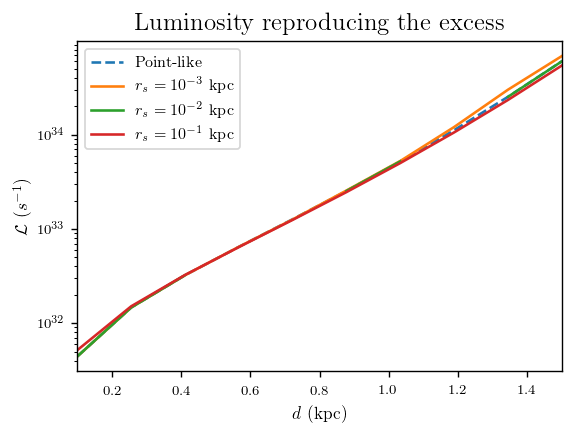

In [8]:
plt.plot(ds, lums_pt, '--', label='Point-like')
for rs in rss:
    plt.plot(ds, lums[rs], label=r'$r_s = 10^{%i}$ kpc' % np.log10(rs))

plt.xlim(ds[[0, -1]])
plt.yscale("log")
plt.xlabel(r"$d$ (kpc)")
plt.ylabel(r"$\mathcal{L}~(s^{-1})$")
plt.legend()
plt.title("Luminosity reproducing the excess")

plt.savefig('figures/lum.pdf', bbox_inches='tight')

## $e^+ + e^-$ spectrum

In [82]:
clump_e_fluxes = {}
pt_e_fluxes = {}

e_es = np.logspace(np.log10(1300), np.log10(1550), 150)

for d in [0.1, 0.3]:
    clump_e_fluxes[d] = dphi_de_e_dampe(e_es, d, 1.5, bg_dampe, gamma=0.5)
    pt_e_fluxes[d] = dphi_de_e_dampe_pt(e_es, d, bg_dampe)

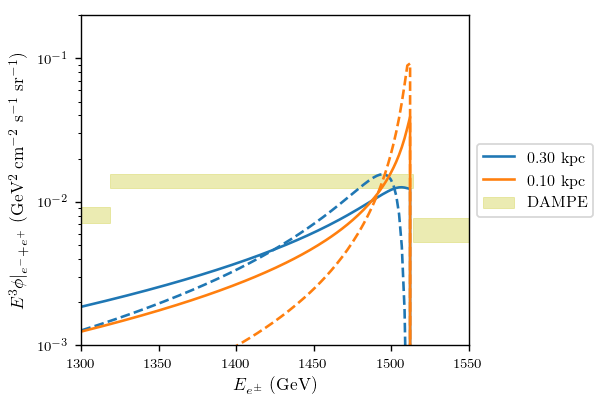

In [83]:
power = 3

plot_obs(power, highlight_excess_bins=False)

for d, c in zip(clump_e_fluxes.iterkeys(), colors):
    plt.plot(e_es, e_es**power * 2*clump_e_fluxes[d],
             label="%.2f kpc" % d, color=c)
    plt.plot(e_es, e_es**power * 2*pt_e_fluxes[d],
             '--', color=c)

plt.xlim(1300, 1550)
plt.ylim(1e-3, 2e-1)
# plt.xscale("log")
plt.yscale("log")

plt.xlabel(r"$E_{e^\pm}$ (GeV)")
plt.ylabel(r"$E^%i \phi|_{e^-+e^+}$ (GeV$^{%i}$ cm$^{-2}$ s$^{-1}$ sr$^{-1}$)" %
           (power, power - 1))

# Shrink current axis by 20%
box = plt.gca().get_position()
plt.gca().set_position([box.x0, box.y0, box.width * 0.8, box.height])

# Put a legend to the right of the current axis
lgd = plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))

# plt.savefig('figures/ep_spectrum.pdf', bbox_extra_artists=(lgd,), bbox_inches='tight')

## $\gamma$ spectrum
WARNING: making $r_s$ too small (in practice, less than about 0.001 kpc for $d \sim 1$ kpc) leads to numerical problems in the luminosity and $J$ factor integrals.

### Flux at 10 GeV as a function of $d$ and $r_s$

In [85]:
clump_10GeV_fluxes_d = {}

e_gammas = np.logspace(np.log10(1300), np.log10(1550), 150)
ds = np.logspace(-2, 0, 50) # kpc
rss = np.logspace(-3, -1, 3)
e_gamma_benchmark = 10. # GeV

In [86]:
for rs in rss:
    clump_10GeV_fluxes_d[rs] = np.array([dphi_de_gamma_dampe([e_gamma_benchmark],
                                                             np.cos(fermi_psf),
                                                             d, rs, bg_dampe)
                                       for d in ds]).flatten()

pt_10GeV_fluxes = np.array([dphi_de_gamma_dampe_pt([e_gamma_benchmark], d, bg_dampe)
                            for d in ds]).flatten()

In [ ]:
power = 0

plt.plot(ds, e_gamma_benchmark**power * pt_10GeV_fluxes_d, '--', label="Point-like")
for rs in rss:
    plt.plot(ds, e_gamma_benchmark**power * clump_10GeV_fluxes_d[rs],
             label=r"$r_s = 10^{%i}$ kpc" % np.log10(rs))

plt.xlim(ds[[0, -1]])
plt.xscale("log")
plt.yscale("log")

plt.title("Photon flux from DM clump")
plt.xlabel(r"$d$ (kpc)")
if power == 0:
    plt.ylabel(r"$\phi|_{\gamma}(E_\gamma = %i)$ (GeV$^{-1}$ cm$^{-2}$ s$^{-1}$ sr$^{-1}$)"
               % e_gamma_benchmark)
else:
    plt.ylabel((r"$E^%i \phi|_{\gamma}(E_\gamma = %i)$ "
                r"(GeV$^{%i}$ cm$^2$ $s$ $sr$)$^{-1}$") 
               % (e_gamma_benchmark, power, 1-power))

box = plt.gca().get_position()
plt.gca().set_position([box.x0, box.y0, box.width * 0.8, box.height])
lgd = plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))

plt.savefig('figures/gamma_ray_flux_d.pdf',
            bbox_extra_artists=(lgd,), bbox_inches='tight')

### Flux at 10 GeV as a function of $\Delta\Omega$

In [56]:
clump_10GeV_fluxes_dOmegas = {}

e_gammas = np.logspace(np.log10(1300), np.log10(1550), 150) # GeV
rss = np.logspace(-3, -1, 3) # kpc
thetas = np.logspace(np.log10(fermi_psf)-1, 0, 100) # rad
dOmegas = 2.*np.pi*(1. - np.cos(thetas)) # sr
e_gamma_benchmark = 10. # GeV

In [57]:
for rs in rss:
    clump_10GeV_fluxes_dOmegas[rs] = np.array(dphi_de_gamma_dampe([e_gamma_benchmark],
                                                                   np.cos(thetas),
                                                                   1., rs,
                                                                  bg_dampe)).flatten()

pt_10GeV_fluxes_dOmegas = np.array(len(thetas) * 
                                   [dphi_de_gamma_dampe_pt([e_gamma_benchmark],
                                                           1., bg_dampe)]).flatten()

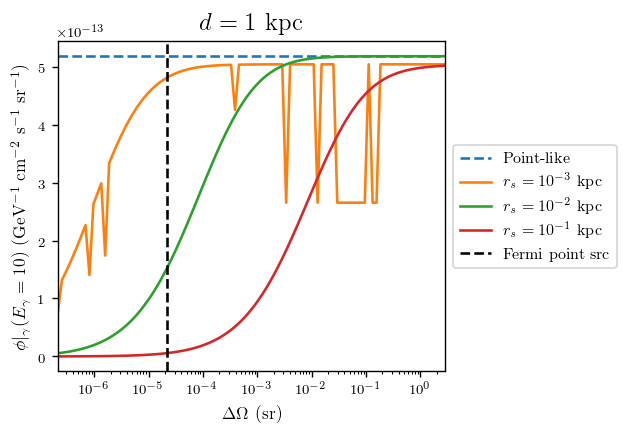

In [60]:
power = 0

plt.plot(dOmegas,
         e_gamma_benchmark**power * pt_10GeV_fluxes_dOmegas,
         '--', label="Point-like")
for rs in rss:
    plt.plot(dOmegas,
             e_gamma_benchmark**power * clump_10GeV_fluxes_dOmegas[rs],
             label=r"$r_s = 10^{%i}$ kpc" % np.log10(rs))

# Solid angle corresponding to Fermi's PSF
plt.axvline(2.*np.pi*(1.-np.cos(fermi_psf)),
            color='k', linestyle="dashed", label="Fermi point src")

plt.xlim(dOmegas[[0, -1]])
plt.xscale("log")
plt.title(r"$d=1$ kpc")
plt.xlabel(r"$\Delta\Omega$ (sr)")
if power == 0:
    plt.ylabel(r"$\phi|_{\gamma}(E_\gamma = %i)$ (GeV$^{-1}$ cm$^{-2}$ s$^{-1}$ sr$^{-1}$)"
               % e_gamma_benchmark)
else:
    plt.ylabel((r"$E^%i \phi|_{\gamma}(E_\gamma = %i)$ "
                r"(GeV$^{%i}$ cm$^2$ $s$ $sr$)$^{-1}$") 
               % (e_gamma_benchmark, power, 1-power))

box = plt.gca().get_position()
plt.gca().set_position([box.x0, box.y0, box.width * 0.8, box.height])
lgd = plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))

plt.savefig('figures/gamma_ray_flux_dOmega.pdf',
            bbox_extra_artists=(lgd,), bbox_inches='tight')

## $\rho_s$

In [16]:
ds = np.linspace(0.01, 1, 100)
rhoss = np.array([rhos_dampe(d, 0.2, bg_dampe) for d in ds])

Text(0.5,1,'$r_s = 0.2$ kpc')

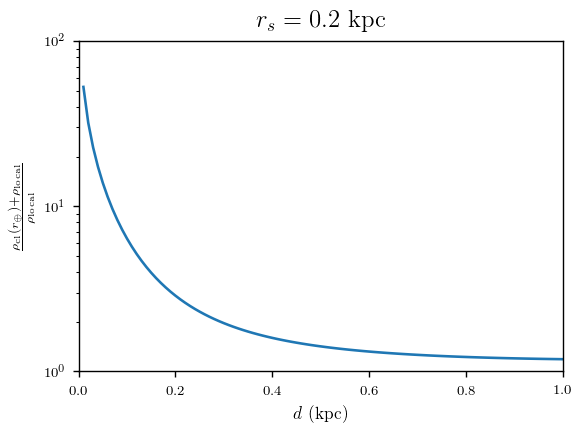

In [18]:
rho_local = 0.3

plt.plot(ds, [(rho_NFW(d, rs=0.1, rhos=rhos, gamma=0.5) + rho_local) / rho_local
              for d, rhos in zip(ds, rhoss)])

plt.yscale("log")
plt.xlim([0, 1])
plt.ylim(1e0, 1e2)

plt.xlabel(r"$d$ (kpc)")
plt.ylabel(r"$\frac{\rho_{\mathrm{cl}}(r_\oplus) + \rho_{\mathrm{local}}}{\rho_{\mathrm{local}}}$")
plt.title(r"$r_s = 0.2$ kpc")

# plt.savefig('figures/rhos_rs_0.1.pdf', bbox_inches='tight')

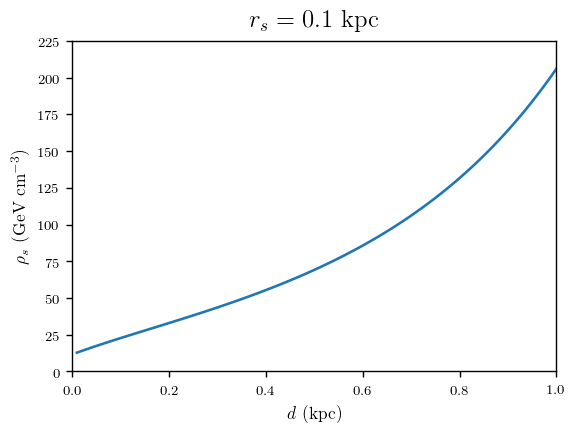

In [90]:
plt.plot(ds, rhoss)

plt.xlim([0, 1])
plt.ylim(0, 225)
plt.xlabel(r"$d$ (kpc)")
plt.ylabel(r"$\rho_s$ (GeV cm$^{-3}$)")
plt.title(r"$r_s = 0.1$ kpc")

plt.savefig('figures/rhos_rs_0.1.pdf', bbox_inches='tight')

# Clump profile comparison

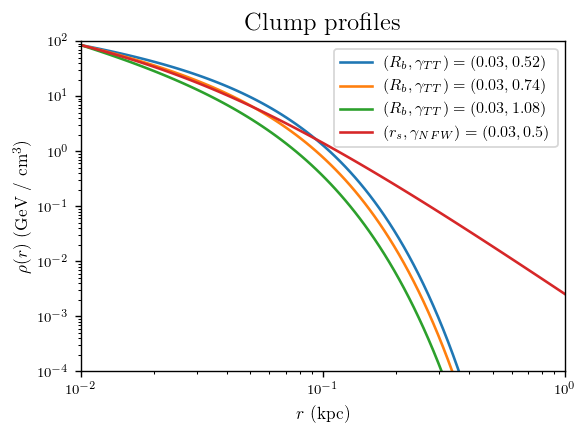

In [80]:
rs = np.logspace(-2, 0, 100)
rho_nfw_ref = rho(rs[0], NFW_params(rs=3e-2, rhos=100., gamma=0.5))
Rb = 3e-2

for gamma in [0.52, 0.74, 1.08]:
    rho_ref = rho(rs[0], TT_params(Rb=Rb, rho0=50., gamma=gamma))
    norm = rho_nfw_ref / rho_ref
    plt.plot(rs, norm * rho(rs, TT_params(Rb=Rb, rho0=50., gamma=gamma)),
             label=r"$(R_b, \gamma_{TT}) = (0.03, %.2f)$" % gamma)

plt.plot(rs, rho(rs, NFW_params(rs=Rb, rhos=100., gamma=0.5)),
         label=r"$(r_s, \gamma_{NFW}) = (0.03, 0.5)$")

plt.autoscale(axis='x', tight=True)
plt.xscale("log")
plt.yscale("log")
plt.ylim(1e-4, 1e2)
plt.xlabel(r"$r$ (kpc)")
plt.ylabel(r"$\rho(r)$ (GeV / cm$^3$)")
plt.title("Clump profiles")
plt.legend()

plt.savefig("figures/profile_comparison.pdf")

# Pointlike clump

In [321]:
e_gamma_ref = 10.
ds = np.logspace(-2, 0, 100)

## $\mathcal{L}$

In [322]:
lums_pt = np.array([lum_dampe_pt(d, bg_dampe) for d in ds])

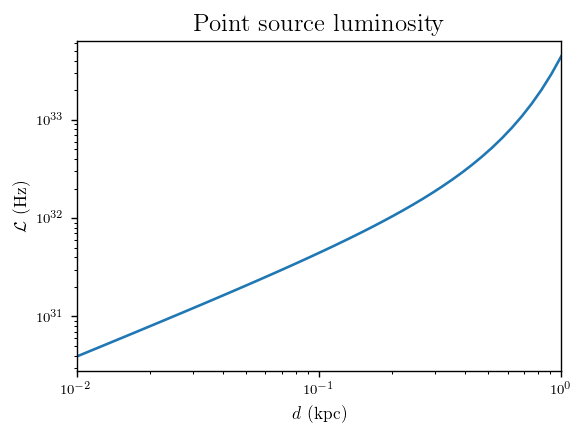

In [344]:
plt.loglog(ds, lums_pt)

plt.autoscale(axis='x', tight=True)
plt.xlabel(r"$d$ (kpc)")
plt.ylabel(r"$\mathcal{L}$ (Hz)")
plt.title(r"Point source luminosity")
plt.savefig("figures/lum_pt.pdf")

## $\frac{d\phi_\gamma}{dE_\gamma}(E_\gamma = 10~\mathrm{GeV})$

In [323]:
dpdeg_10GeVs_pt = np.array([dphi_de_gamma_pt(e_gamma_ref, d, dampe_excess_bin_high, lum)
                             for lum, d in zip(lums_pt, ds)])

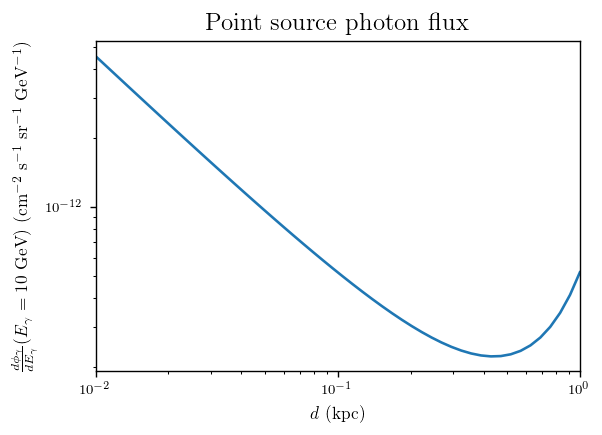

In [345]:
plt.loglog(ds, dpdeg_10GeVs_pt)

plt.autoscale(axis='x', tight=True)
plt.xlabel(r"$d$ (kpc)")
plt.ylabel(r"$\frac{d\phi_\gamma}{dE_\gamma}(E_\gamma = 10~\mathrm{GeV})$ (cm$^{-2}$ s$^{-1}$ sr$^{-1}$ GeV$^{-1}$)")
plt.title(r"Point source photon flux")
plt.savefig("figures/gamma_ray_flux_pt.pdf")

## Line width constraints

In [324]:
lw_contrs_pt = np.array([constrain_ep_spec_pt(d, dampe_excess_bin_high, lum, bg_dampe)
                         for lum, d in zip(lums_pt, ds)])

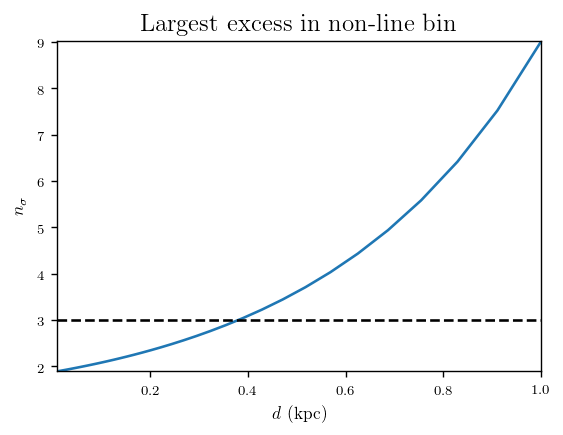

In [346]:
plt.plot(ds, lw_contrs_pt)
plt.axhline(3, color='k', linestyle='--')

plt.autoscale(tight=True)
plt.xlabel(r"$d$ (kpc)")
plt.ylabel(r"$n_\sigma$")
plt.title("Largest excess in non-line bin")
plt.savefig("figures/line_width_pt.pdf")

# NFW profile

In [238]:
gamma_nfw = 0.5
e_gamma_ref = 10.

ds = np.logspace(-2, 0, 50)
rss = np.logspace(-2, -1, 50)
d_mg, rs_mg = np.meshgrid(ds, rss)

## $\rho_s$, $\frac{\rho_s + \rho_\oplus}{\rho_\oplus}$

In [46]:
rhoss_nfw = np.array([[normalize_clump_dampe(d, NFW_params(rs, 1., gamma_nfw),
                                             bg_dampe).rhos
                       for d in ds]
                      for rs in rss])

rho_rels_nfw = np.array([[(rho(d, NFW_params(rs, rhos, gamma_nfw)) + rho_earth) / rho_earth
                          for rhos, d in zip(rhos_list, ds)]
                         for rhos_list, rs in zip(rhoss_nfw, rss)])

### Plot

<a list of 7 text.Text objects>

/Users/acoogan/.pyenv/versions/2.7.13/Python.framework/Versions/2.7/lib/python2.7/site-packages/matplotlib/font_manager.py:1328: UserWarning: findfont: Font family [u'serif'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))


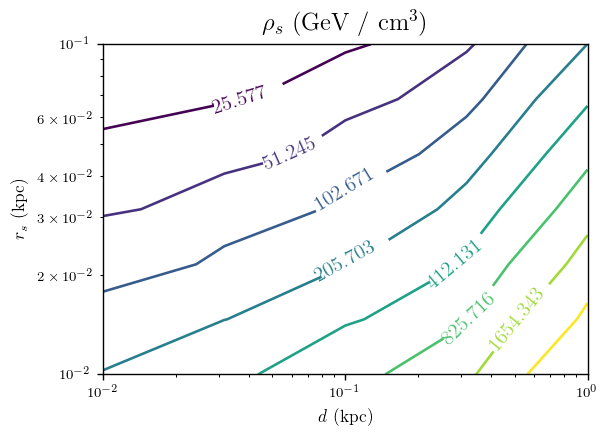

In [8]:
rhoss_cs = plt.contour(d_mg, rs_mg, rhoss_nfw,
                       levels=np.logspace(np.log10(np.nanmin(rhoss_nfw)),
                                          np.log10(np.nanmax(rhoss_nfw)),
                                          10),
                       norm=LogNorm())

plt.xlim(ds[[0, -1]])
plt.ylim(rss[[0, -1]])
plt.xlabel(r"$d$ (kpc)")
plt.ylabel(r"$r_s$ (kpc)")
plt.xscale("log")
plt.yscale("log")
plt.title(r"$\rho_s$ (GeV / cm$^3$)")

plt.clabel(rhoss_cs, inline=True)

<a list of 8 text.Text objects>

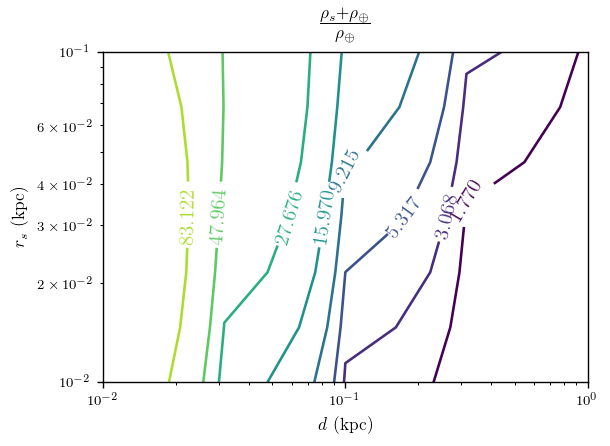

In [10]:
rho_rels_cs = plt.contour(d_mg, rs_mg, rho_rels_nfw,
                          levels=np.logspace(np.log10(np.nanmin(rho_rels_nfw)),
                                             np.log10(np.nanmax(rho_rels_nfw)),
                                             10),
                          norm=LogNorm())

plt.xlim(ds[[0, -1]])
plt.ylim(rss[[0, -1]])
plt.xlabel(r"$d$ (kpc)")
plt.ylabel(r"$r_s$ (kpc)")
plt.xscale("log")
plt.yscale("log")
plt.title(r"$\frac{\rho_s + \rho_\oplus}{\rho_\oplus}$")

plt.clabel(rho_rels_cs, inline=True)

## $\mathcal{L}$

In [50]:
lums_nfw = np.array([[luminosity(NFW_params(rs, rhos, gamma_nfw), dampe_excess_bin_high)
                      for rhos in rhos_list]
                     for rs, rhos_list in zip(rss, rhoss_nfw)])

### Plot

<a list of 8 text.Text objects>

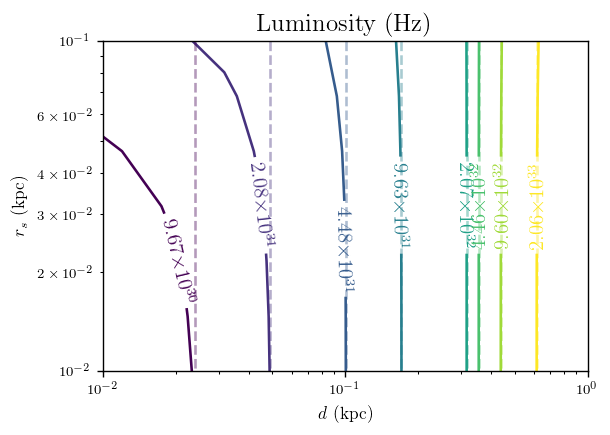

In [14]:
# Clump luminosities
lum_cs = plt.contour(d_mg, rs_mg, lums_nfw,
                     levels=np.logspace(np.log10(np.nanmin(lums_nfw)),
                                        np.log10(np.nanmax(lums_nfw)),
                                        10),
                     norm=LogNorm())
# Point-like luminosities
lum_pt_cs = plt.contour(d_mg, rs_mg, lums_pt,
                        levels=lum_cs.levels,
                        norm=LogNorm(),
                        alpha=0.4,
                        linestyles='dashed')

plt.xlim(ds[[0, -1]])
plt.ylim(rss[[0, -1]])
plt.xlabel(r"$d$ (kpc)")
plt.ylabel(r"$r_s$ (kpc)")
plt.xscale("log")
plt.yscale("log")
plt.title(r"Luminosity (Hz)")

# Format the contour labels
clabels_lums = {level: (r"%.2f" % (level / 10**np.floor(np.log10(level)))) +
                (r"$\times 10^{%i}$" % np.floor(np.log10(level)))
                for level in lum_cs.levels}
plt.clabel(lum_cs, inline=True, fmt=clabels_lums)

## $\frac{d\phi_\gamma}{d E_\gamma} (E_\gamma = 10$ GeV)

Compute differential photon flux at $E_\gamma = 10$ GeV for clump and point-like cases.

In [52]:
dpdeg_10GeVs_nfw = np.array([[dphi_de_gamma(e_gamma_ref, fermi_psf, d,
                                        NFW_params(rs, rhos, gamma_nfw),
                                        dampe_excess_bin_high)
                          for d, rhos in zip(ds, rhos_list)]
                         for rs, rhos_list in zip(rss, rhoss_nfw)])

### Plot

<a list of 7 text.Text objects>

/Users/acoogan/.pyenv/versions/2.7.13/Python.framework/Versions/2.7/lib/python2.7/site-packages/matplotlib/font_manager.py:1328: UserWarning: findfont: Font family [u'serif'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))


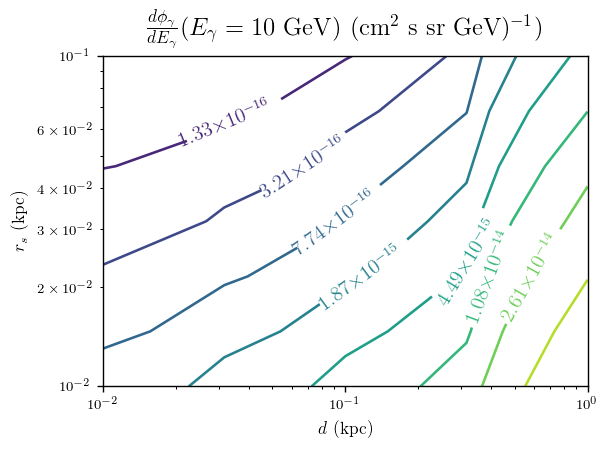

In [8]:
dpdeg_10GeVs_cs = plt.contour(d_mg, rs_mg, dpdeg_10GeVs_nfw,
                              levels=np.logspace(np.log10(np.nanmin(dpdeg_10GeVs_nfw)),
                                                 np.log10(np.nanmax(dpdeg_10GeVs_nfw)),
                                                 10),
                              norm=LogNorm())

# dpdeg_10GeVs_pt_cs = plt.contour(d_mg, rs_mg, dpdeg_10GeVs_pt,
#                                  levels=np.logspace(np.log10(np.nanmin(dpdeg_10GeVs_pt)),
#                                                     np.log10(np.nanmax(dpdeg_10GeVs_pt)),
#                                                     10),
#                                  norm=LogNorm(),
#                                  alpha=0.4,
#                                  linestyles='dashed')

plt.xlim(ds[[0, -1]])
plt.ylim(rss[[0, -1]])
plt.xlabel(r"$d$ (kpc)")
plt.ylabel(r"$r_s$ (kpc)")
plt.xscale("log")
plt.yscale("log")
plt.title(r"$\frac{d\phi_\gamma}{d E_\gamma}(E_\gamma=10~\mathrm{GeV})$ "
          r"(cm$^2$ s sr GeV)$^{-1})$")

# Format the contour labels
clabels_dpdeg_10GeVs = {level: (r"%.2f" % (level / 10**np.floor(np.log10(level)))) +
                (r"$\times 10^{%i}$" % np.floor(np.log10(level)))
                for level in dpdeg_10GeVs_cs.levels}
plt.clabel(dpdeg_10GeVs_cs, inline=True, fmt=clabels_dpdeg_10GeVs)

### Some horizontal slices through this plot

In [31]:
clump_10GeV_fluxes_d = {}

ds = np.logspace(-2, 0, 50)
rss_vals = np.logspace(-3, -1, 3)
e_gamma_benchmark = 10.

for rs in rss_vals:
    clump_10GeV_fluxes_d[rs] = \
        np.array([dphi_de_gamma_dampe(e_gamma_benchmark,
                                      fermi_psf, d,
                                      NFW_params(rs, 1., gamma_nfw),
                                      bg_dampe)
                  for d in ds]).flatten()

In [33]:
pt_10GeV_fluxes_d = np.array([dphi_de_gamma_dampe_pt([e_gamma_benchmark], d, bg_dampe)
                              for d in ds]).flatten()

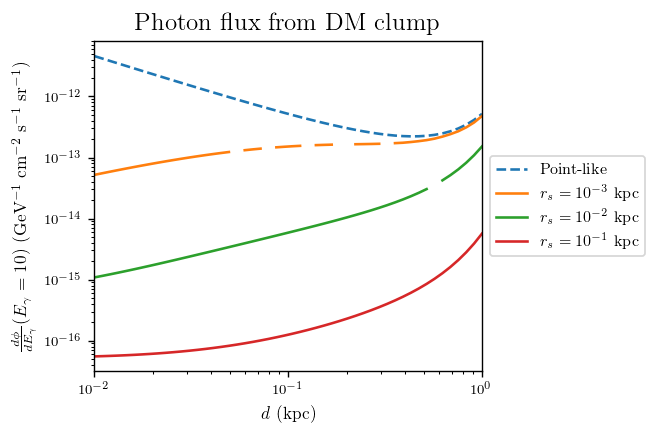

In [34]:
power = 0

plt.plot(ds, e_gamma_benchmark**power * pt_10GeV_fluxes_d, '--', label="Point-like")
for rs in rss_vals:
    plt.plot(ds, e_gamma_benchmark**power * clump_10GeV_fluxes_d[rs],
             label=r"$r_s = 10^{%i}$ kpc" % np.log10(rs))

plt.xlim(ds[[0, -1]])
plt.xscale("log")
plt.yscale("log")

plt.title("Photon flux from DM clump")
plt.xlabel(r"$d$ (kpc)")
if power == 0:
    plt.ylabel(r"$\frac{d\phi}{dE_\gamma}(E_\gamma = %i)$ "
               "(GeV$^{-1}$ cm$^{-2}$ s$^{-1}$ sr$^{-1}$)" % e_gamma_benchmark)
else:
    plt.ylabel((r"$E^%i \frac{d\phi}{dE_\gamma}(E_\gamma = %i)$ "
                r"(GeV$^{%i}$ cm$^2$ $s$ $sr$)$^{-1}$") % (e_gamma_benchmark,
                                                           power, 1-power))

box = plt.gca().get_position()
plt.gca().set_position([box.x0, box.y0, box.width * 0.8, box.height])
lgd = plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))

## $\frac{\theta_{50\%}}{\theta_{\mathrm{Fermi}}}$

In [ ]:
extents_nfw = np.array([[gamma_ray_extent(e_gamma_ref, d, dampe_excess_bin_high,
                                          NFW_params(rs, rhos, gamma_nfw))
                         for rhos, d in zip(rhos_list, ds)]
                        for rhos_list, rs in zip(rhoss_nfw, rss)])

### Plot

<a list of 8 text.Text objects>

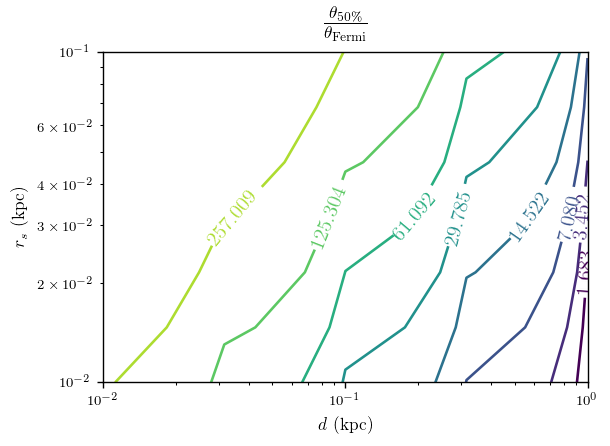

In [38]:
extents_cs = plt.contour(d_mg, rs_mg, extents / fermi_psf,
                         levels=np.logspace(np.log10(np.nanmin(extents / fermi_psf)),
                                            np.log10(np.nanmax(extents / fermi_psf)),
                                            10),
                         norm=LogNorm())

plt.xlim(ds[[0, -1]])
plt.ylim(rss[[0, -1]])
plt.xlabel(r"$d$ (kpc)")
plt.ylabel(r"$r_s$ (kpc)")
plt.xscale("log")
plt.yscale("log")
plt.title(r"$\frac{\theta_{50\%}}{\theta_{\mathrm{Fermi}}}$")


# Format the contour labels
plt.clabel(extents_cs, inline=True)

## Line width constraint

In [301]:
lw_contrs_nfw = np.array([[constrain_ep_spec(d, dampe_excess_bin_high,
                                             NFW_params(rs, rhos, gamma_nfw), bg_dampe)
                           for rhos, d in zip(rhos_list, ds)]
                          for rhos_list, rs in zip(rhoss_nfw, rss)])

# Line width constraint
d_max_lw = ds[np.where(lw_contrs_nfw[0, :] > 3)[0][0]]

### Plot

Text(0.5,1,'Line width constraint')

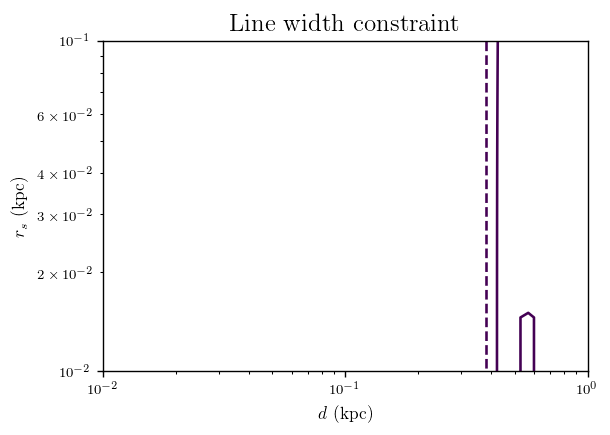

In [98]:
n_sigma = 3.

lw_contrs_cs = plt.contour(d_mg, rs_mg, lw_contrs_nfw,
                           levels=[n_sigma])

lw_contrs_pt_cs = plt.contour(d_mg, rs_mg, lw_contrs_pt,
                              levels=[n_sigma], linestyles='dashed')

plt.xlim(ds[[0, -1]])
plt.ylim(rss[[0, -1]])
plt.xlabel(r"$d$ (kpc)")
plt.ylabel(r"$r_s$ (kpc)")
plt.xscale("log")
plt.yscale("log")
plt.title(r"Line width constraint")

Line width constraint is basically the same for a clump vs point-like source:

In [58]:
d_max_lw = ds[np.where(lw_contrs_pt[0, :] > 3)[0][0]]

## Save results

In [81]:
with open('data/ds.pkl', 'w') as f:
    pickle.dump(ds, f)
with open('data/rss.pkl', 'w') as f:
    pickle.dump(rss, f)

halo_name = "nfw"
suffix = "gamma_%.1f" % (gamma_nfw)

for basename in ["rhoss", "rho_rels", "lums", "dpdeg_10GeVs", "extents", "lw_contrs"]:
    name = (basename + "_" + halo_name)
    
    with open('data/' + name + '_' + suffix + '.pkl', 'w') as f:
        pickle.dump(eval(name), f)

with open('data/lums_pt.pkl', 'w') as f:
    pickle.dump(lums_pt, f)

with open('data/dpdeg_10GeVs_pt.pkl', 'w') as f:
    pickle.dump(dpdeg_10GeVs_pt, f)

with open('data/lw_contrs_pt.pkl', 'w') as f:
    pickle.dump(lw_contrs_pt, f)

## Read results

In [239]:
with open('data/ds.pkl') as f:
    ds = pickle.load(f)
with open('data/rss.pkl') as f:
    rss = pickle.load(f)

halo_name = "nfw"
suffix = "gamma_%.1f" % (gamma_nfw)

with open('data/rhoss_' + halo_name + '_' + suffix + '.pkl') as f:
    rhoss_nfw = pickle.load(f)

with open('data/rho_rels_' + halo_name + '_' + suffix + '.pkl') as f:
    rho_rels_nfw = pickle.load(f)

with open('data/lums_' + halo_name + '_' + suffix + '.pkl') as f:
    lums_nfw = pickle.load(f)
with open('data/lums_pt.pkl') as f:
    lums_pt = pickle.load(f)

with open('data/dpdeg_10GeVs_' + halo_name + '_' + suffix + '.pkl') as f:
    dpdeg_10GeVs_nfw = pickle.load(f)
with open('data/dpdeg_10GeVs_pt.pkl') as f:
    dpdeg_10GeVs_pt = pickle.load(f)

with open('data/extents_' + halo_name + '_' + suffix + '.pkl') as f:
    extents_nfw = pickle.load(f)

with open('data/lw_contrs_' + halo_name + '_' + suffix + '.pkl') as f:
    lw_contrs_nfw = pickle.load(f)
with open('data/lw_contrs_pt.pkl') as f:
    lw_contrs_pt = pickle.load(f)
    
# Line width constraint
d_max_lw_nfw = ds[np.where(lw_contrs_nfw[0, :] > 3)[0][0]]

## Plot everything together

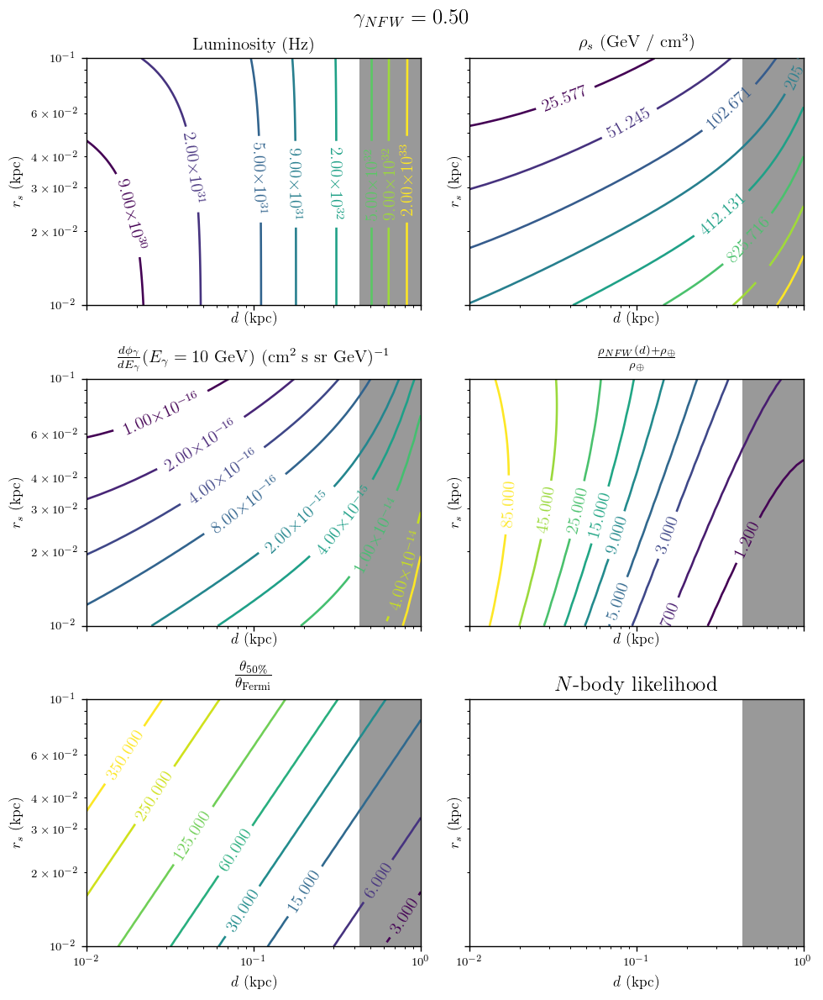

In [348]:
fig, axs = plt.subplots(nrows=3, ncols=2, sharex=True, sharey=True,
                        figsize=(8, 10))

for ax in axs.flatten():
    # Label axes
    ax.set_xlabel(r"$d$ (kpc)")
    ax.set_ylabel(r"$r_s$ (kpc)")
    # Line width constraint
    ax.axvspan(d_max_lw_nfw, ds[-1], color='k', linewidth=0, alpha=0.4)

### Luminosity
ax = axs[0, 0]
ax.set_title(r"Luminosity (Hz)", fontsize=12)

# Clump luminosities
lum_cs = ax.contour(d_mg, rs_mg, lums_nfw,
#                     levels=np.logspace(np.log10(np.nanmin(lums_nfw)),
#                                        np.log10(np.nanmax(lums_nfw)),
#                                        10),
                    levels=lum_levels,
                    norm=LogNorm())

# Only need to do this once
ax.set_xlim(ds[[0, -1]])
ax.set_ylim(rss[[0, -1]])
ax.set_xscale("log")
ax.set_yscale("log")

# Format the contour labels
clabels_lums = {level: (r"%.2f" % (level / 10**np.floor(np.log10(level)))) +
                (r"$\times 10^{%i}$" % np.floor(np.log10(level)))
                for level in lum_cs.levels}
ax.clabel(lum_cs, inline=True, fmt=clabels_lums)

### Density normalization
ax = axs[0, 1]
ax.set_title(r"$\rho_s$ (GeV / cm$^3$)", fontsize=12)

rhoss_cs = ax.contour(d_mg, rs_mg, rhoss_nfw,
                      levels=np.logspace(np.log10(np.nanmin(rhoss_nfw)),
                                         np.log10(np.nanmax(rhoss_nfw)),
                                         10),
                      norm=LogNorm())

ax.clabel(rhoss_cs, inline=True)

### Contribution to local density
ax = axs[1, 1]
ax.set_title(r"$\frac{\rho_{NFW}(d) + \rho_\oplus}{\rho_\oplus}$", fontsize=12)

rho_rels_cs = ax.contour(d_mg, rs_mg, rho_rels_nfw,
#                          levels=np.logspace(np.log10(np.nanmin(rho_rels_nfw)),
#                                             np.log10(np.nanmax(rho_rels_nfw)),
#                                             10),
                         levels=rho_rel_levels,
                         norm=LogNorm())

ax.clabel(rho_rels_cs, inline=True)

### Photon flux at E_gamma = 10 GeV
ax = axs[1, 0]
ax.set_title(r"$\frac{d\phi_\gamma}{d E_\gamma}(E_\gamma=10~\mathrm{GeV})$ "
             r"(cm$^2$ s sr GeV)$^{-1}$", fontsize=12)
dpdeg_10GeVs_cs = ax.contour(d_mg, rs_mg, dpdeg_10GeVs_nfw,
#                              levels=np.logspace(np.log10(np.nanmin(dpdeg_10GeVs_nfw)),
#                                                 np.log10(np.nanmax(dpdeg_10GeVs_nfw)),
#                                                 10),
                             dphi_de_g_levels,
                             norm=LogNorm())

# Format the contour labels
clabels_dpdeg_10GeVs = {level: (r"%.2f" % (level / 10**np.floor(np.log10(level)))) +
                (r"$\times 10^{%i}$" % np.floor(np.log10(level)))
                for level in dpdeg_10GeVs_cs.levels}
ax.clabel(dpdeg_10GeVs_cs, inline=True, fmt=clabels_dpdeg_10GeVs)

### Angular extent of gamma rays
ax = axs[2, 0]
ax.set_title(r"$\frac{\theta_{50\%}}{\theta_{\mathrm{Fermi}}}$")
extents_cs = ax.contour(d_mg, rs_mg, extents_nfw / fermi_psf,
#                          levels=np.logspace(np.log10(np.nanmin(extents_nfw / fermi_psf)),
#                                             np.log10(np.nanmax(extents_nfw / fermi_psf)),
#                                             10),
                        extent_levels,
                        norm=LogNorm())

ax.clabel(extents_cs, inline=True)

### For Ben to do
axs[2, 1].set_title(r"$N$-body likelihood")

fig.suptitle(r"$\gamma_{NFW} = %.2f$" % gamma_nfw)
fig.tight_layout(rect=[0, 0.03, 1, 0.975])
fig.savefig("figures/contour_plots_nfw_gamma_%.1f.pdf" % gamma_nfw)

# Tidally truncated profile

In [41]:
gamma_tt_quartiles = [0.516816, 0.74, 1.08222]

gamma_tt = gamma_tt_quartiles[1]
e_gamma_ref = 10.

ds = np.logspace(-2, 0, 50)
Rbs = np.logspace(-2, -1, 50)
d_mg, Rb_mg = np.meshgrid(ds, Rbs)

## $\rho_s$, $\frac{\rho_s + \rho_\oplus}{\rho_\oplus}$
Breaks for $\gamma_{TT} = 1.08222$

In [42]:
rho0s_tt_raw = np.array([[normalize_clump_dampe(d, TT_params(Rb, 1., gamma_tt),
                                                bg_dampe).rho0
                          for d in ds]
                         for Rb in Rbs])

Interpolate to fill points missing due to numerical issues. Cubic interpolation seems to work quite well.

In [43]:
obs_idxs = np.where(~np.isnan(rho0s_tt_raw.flatten()))[0]

rho0s_tt = np.exp(griddata(np.array(list(itertools.product(ds, Rbs)))[obs_idxs],
                           np.log(rho0s_tt_raw.flatten())[obs_idxs],
                           (d_mg, Rb_mg),
                           method='cubic')).T

In [44]:
rho_rels_tt = np.array([[(rho(d, TT_params(Rb, rho0, gamma_tt)) + rho_earth) / rho_earth
                          for rho0, d in zip(rho0_list, ds)]
                         for rho0_list, Rb in zip(rho0s_tt, Rbs)])

## $\mathcal{L}$

In [45]:
lums_tt = np.array([[luminosity(TT_params(Rb, rho0, gamma_tt), dampe_excess_bin_high)
                      for rho0 in rho0_list]
                     for Rb, rho0_list in zip(Rbs, rho0s_tt)])

## $\frac{d\phi_\gamma}{d E_\gamma} (E_\gamma = 10$ GeV)

Compute differential photon flux at $E_\gamma = 10$ GeV for clump and point-like cases.

In [46]:
dpdeg_10GeVs_tt = np.array([[dphi_de_gamma(e_gamma_ref, fermi_psf, d,
                                        TT_params(Rb, rho0, gamma_tt),
                                        dampe_excess_bin_high)
                          for d, rho0 in zip(ds, rho0_list)]
                         for Rb, rho0_list in zip(Rbs, rho0s_tt)])

### Some horizontal slices through this plot
Need to fix the numerical issues.

In [59]:
clump_10GeV_fluxes_d = {}

ds = np.logspace(-2, 0, 10)
Rbs_vals = np.logspace(-3, -1, 3)
e_gamma_benchmark = 10.

for Rb in Rbs_vals:
    clump_10GeV_fluxes_d[Rb] = \
        np.array([dphi_de_gamma_dampe(e_gamma_benchmark,
                                      fermi_psf, d,
                                      TT_params(Rb, 1., gamma_tt),
                                      bg_dampe)
                  for d in ds]).flatten()

/Users/acoogan/.pyenv/versions/2.7.13/Python.framework/Versions/2.7/lib/python2.7/site-packages/scipy/integrate/quadpack.py:385: IntegrationWarning: The integral is probably divergent, or slowly convergent.
  warnings.warn(msg, IntegrationWarning)
finite_clump.py:194: RuntimeWarning: divide by zero encountered in double_scalars
  rho_norm = np.sqrt(residual_iflux / dm_iflux)


In [60]:
pt_10GeV_fluxes_d = np.array([dphi_de_gamma_dampe_pt([e_gamma_benchmark], d, bg_dampe)
                              for d in ds]).flatten()

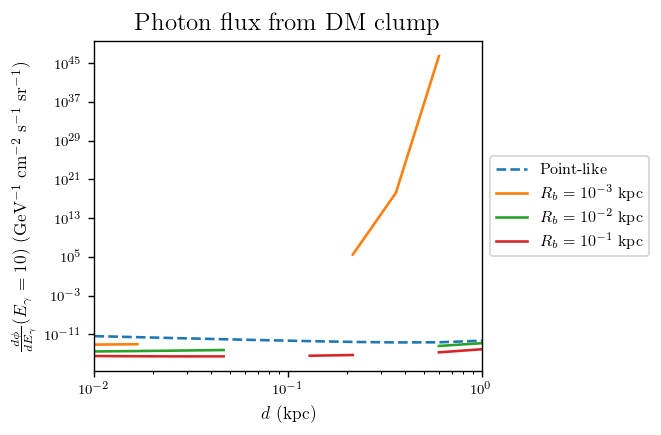

In [61]:
power = 0

plt.plot(ds, e_gamma_benchmark**power * pt_10GeV_fluxes_d, '--', label="Point-like")
for Rb in Rbs_vals:
    plt.plot(ds, e_gamma_benchmark**power * clump_10GeV_fluxes_d[Rb],
             label=r"$R_b = 10^{%i}$ kpc" % np.log10(Rb))

plt.xlim(ds[[0, -1]])
plt.xscale("log")
plt.yscale("log")

plt.title("Photon flux from DM clump")
plt.xlabel(r"$d$ (kpc)")
if power == 0:
    plt.ylabel(r"$\frac{d\phi}{dE_\gamma}(E_\gamma = %i)$ "
               "(GeV$^{-1}$ cm$^{-2}$ s$^{-1}$ sr$^{-1}$)" % e_gamma_benchmark)
else:
    plt.ylabel((r"$E^%i \frac{d\phi}{dE_\gamma}(E_\gamma = %i)$ "
                r"(GeV$^{%i}$ cm$^2$ $s$ $sr$)$^{-1}$") % (e_gamma_benchmark,
                                                           power, 1-power))

box = plt.gca().get_position()
plt.gca().set_position([box.x0, box.y0, box.width * 0.8, box.height])
lgd = plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))

## $\frac{\theta_{50\%}}{\theta_{\mathrm{Fermi}}}$

In [47]:
extents_tt = np.array([[gamma_ray_extent(e_gamma_ref, d, dampe_excess_bin_high,
                                          TT_params(Rb, rho0, gamma_tt))
                         for rho0, d in zip(rho0_list, ds)]
                        for rho0_list, Rb in zip(rho0s_tt, Rbs)])

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
Exception ZeroDivisionError: ZeroDivisionError('division by zero',) in "<Numba C callback 'dJ_dr_cf'>" ignored
E

### Not sure how to handle the numerical issues.

In [ ]:
extents_tt_copy = extents_tt.copy()

jump_row_idxs, jump_col_idxs = np.where(np.abs(extents_tt_copy[:, :-1] -
                                               extents_tt_copy[:, 1:]) > 0.1)
jump_col_idxs = jump_col_idxs + 1

extents_tt_copy[jump_row_idxs, jump_col_idxs] = np.nan
extents_tt_copy[jump_row_idxs, jump_col_idxs] = np.nan
extents_tt_copy[jump_row_idxs, jump_col_idxs-1] = np.nan

## Line width constraint

In [49]:
lw_contrs_tt_raw = np.array([[constrain_ep_spec(d, dampe_excess_bin_high,
                                                TT_params(Rb, rho0, gamma_tt), bg_dampe)
                              for rho0, d in zip(rho0_list, ds)]
                             for rho0_list, Rb in zip(rho0s_tt, Rbs)])

Interpolate the points where there were numerical issues. This doesn't work as well. Not sure what to do.

In [50]:
lw_contrs_tt_raw[lw_contrs_tt_raw == 0] = np.nan
obs_idxs = np.where(~np.isnan(lw_contrs_tt_raw.flatten()))[0]

lw_contrs_tt = griddata(np.array(list(itertools.product(ds, Rbs)))[obs_idxs],
                        lw_contrs_tt_raw.flatten()[obs_idxs],
                        (d_mg, Rb_mg),
                        method='cubic').T

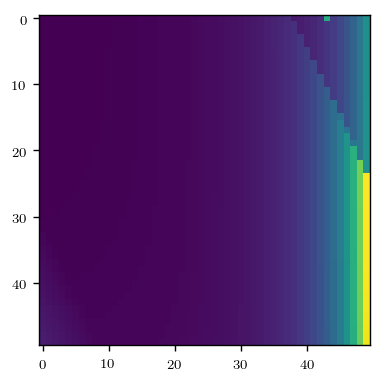

In [314]:
plt.imshow(lw_contrs_tt)

Text(0.5,1,'Line width constraint')

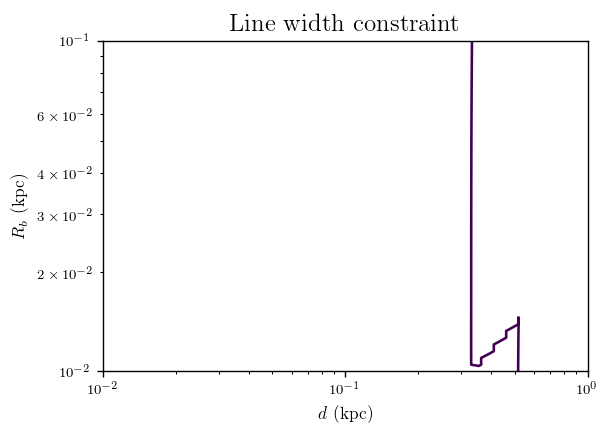

In [319]:
n_sigma = 3.

lw_contrs_cs = plt.contour(d_mg, Rb_mg, lw_contrs_tt,
                           levels=[n_sigma])

# lw_contrs_pt_cs = plt.contour(d_mg, Rb_mg, lw_contrs_pt,
#                               levels=[n_sigma], linestyles='dashed')

plt.xlim(ds[[0, -1]])
plt.ylim(Rbs[[0, -1]])
plt.xlabel(r"$d$ (kpc)")
plt.ylabel(r"$R_b$ (kpc)")
plt.xscale("log")
plt.yscale("log")
plt.title(r"Line width constraint")

## Save results

In [56]:
halo_name = "tt"
fn_prefix = 'data/' + halo_name + '_' + "gamma_%.2f" % (gamma_tt)

with open(fn_prefix + '/ds.pkl', 'w') as f:
    pickle.dump(ds, f)
with open(fn_prefix + '/Rbs.pkl', 'w') as f:
    pickle.dump(Rbs, f)

for name in ["rho0s", "rho_rels", "lums", "dpdeg_10GeVs", "extents", "lw_contrs"]:
    fn = fn_prefix + '/' + name + '.pkl'
    print(fn, name + '_' + halo_name)
    
    with open(fn, 'w') as f:
        pickle.dump(eval(name + '_' + halo_name), f)

('data/tt_gamma_0.74/rho0s.pkl', 'rho0s_tt')
('data/tt_gamma_0.74/rho_rels.pkl', 'rho_rels_tt')
('data/tt_gamma_0.74/lums.pkl', 'lums_tt')
('data/tt_gamma_0.74/dpdeg_10GeVs.pkl', 'dpdeg_10GeVs_tt')
('data/tt_gamma_0.74/extents.pkl', 'extents_tt')
('data/tt_gamma_0.74/lw_contrs.pkl', 'lw_contrs_tt')


## Read results

In [38]:
halo_name = "tt"
fn_prefix = 'data/' + halo_name + '_' + "gamma_%.2f" % (gamma_tt)

print(fn_prefix)

with open(fn_prefix + '/ds.pkl') as f:
    ds = pickle.load(f)
with open(fn_prefix + '/Rbs.pkl') as f:
    Rbs = pickle.load(f)

with open(fn_prefix + '/rho0s.pkl') as f:
    rho0s_tt = pickle.load(f)

with open(fn_prefix + '/rho_rels.pkl') as f:
    rho_rels_tt = pickle.load(f)

with open(fn_prefix + '/lums.pkl') as f:
    lums_tt = pickle.load(f)

with open(fn_prefix + '/dpdeg_10GeVs.pkl') as f:
    dpdeg_10GeVs_tt = pickle.load(f)

with open(fn_prefix + '/extents.pkl') as f:
    extents_tt = pickle.load(f)

with open(fn_prefix + '/lw_contrs.pkl') as f:
    lw_contrs_tt = pickle.load(f)
    
# Line width constraint
d_max_lw_tt = ds[np.where(lw_contrs_tt[lw_contrs_tt.shape[0]/2, :] > 3)[0][0]]

data/tt_gamma_0.52


## Plot everything together

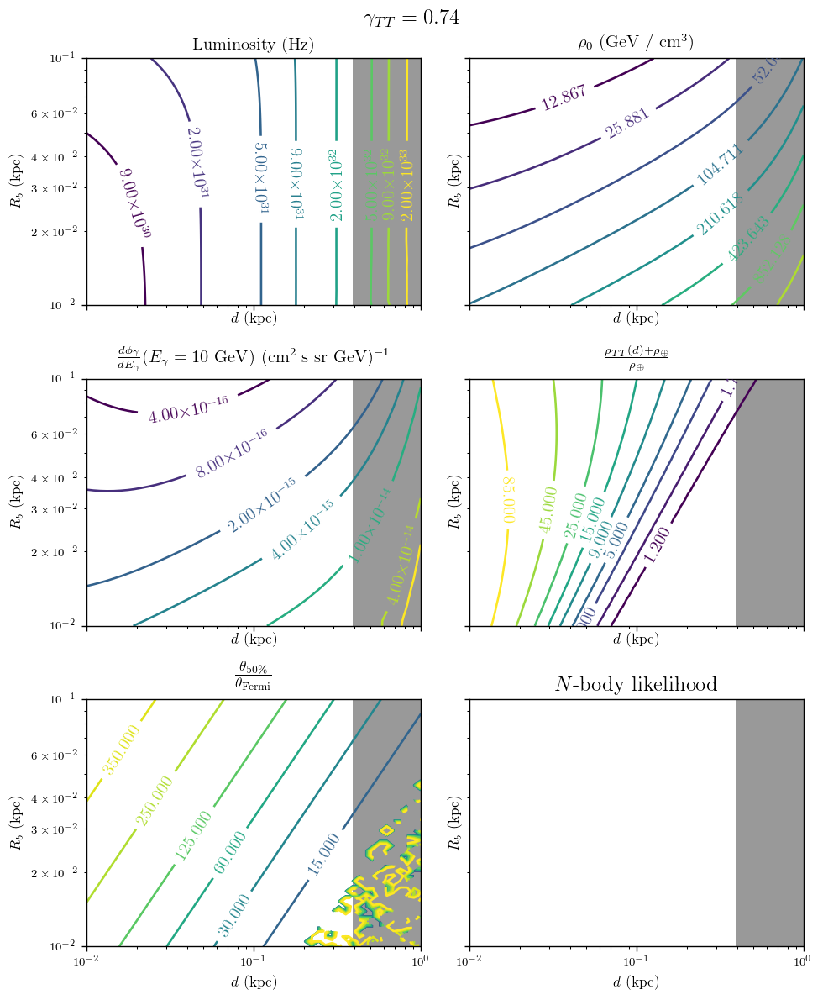

In [53]:
fig, axs = plt.subplots(nrows=3, ncols=2, sharex=True, sharey=True,
                        figsize=(8, 10))

for ax in axs.flatten():
    # Label axes
    ax.set_xlabel(r"$d$ (kpc)")
    ax.set_ylabel(r"$R_b$ (kpc)")
    # Line width constraint
    ax.axvspan(d_max_lw_tt, ds[-1], color='k', linewidth=0, alpha=0.4)

### Luminosity
ax = axs[0, 0]
ax.set_title(r"Luminosity (Hz)", fontsize=12)

# Clump luminosities
lum_cs = ax.contour(d_mg, Rb_mg, lums_tt,
#                     levels=np.logspace(np.log10(np.nanmin(lums_tt)),
#                                        np.log10(np.nanmax(lums_tt)),
#                                        10),
                    levels=lum_levels,
                    norm=LogNorm())

# Only need to do this once
ax.set_xlim(ds[[0, -1]])
ax.set_ylim(Rbs[[0, -1]])
ax.set_xscale("log")
ax.set_yscale("log")

# Format the contour labels
clabels_lums = {level: (r"%.2f" % (level / 10**np.floor(np.log10(level)))) +
                (r"$\times 10^{%i}$" % np.floor(np.log10(level)))
                for level in lum_cs.levels}
ax.clabel(lum_cs, inline=True, fmt=clabels_lums)

### Density normalization
ax = axs[0, 1]
ax.set_title(r"$\rho_0$ (GeV / cm$^3$)", fontsize=12)

rho0s_cs = ax.contour(d_mg, Rb_mg, rho0s_tt,
                      levels=np.logspace(np.log10(np.nanmin(rho0s_tt)),
                                         np.log10(np.nanmax(rho0s_tt)),
                                         10),
                      norm=LogNorm())

ax.clabel(rho0s_cs, inline=True)

### Contribution to local density
ax = axs[1, 1]
ax.set_title(r"$\frac{\rho_{TT}(d) + \rho_\oplus}{\rho_\oplus}$", fontsize=12)

rho_rels_cs = ax.contour(d_mg, Rb_mg, rho_rels_tt,
#                          levels=np.logspace(np.log10(np.nanmin(rho_rels_tt)),
#                                             np.log10(np.nanmax(rho_rels_tt)),
#                                             10),
                         levels=rho_rel_levels,
                         norm=LogNorm())

ax.clabel(rho_rels_cs, inline=True)

### Photon flux at E_gamma = 10 GeV
ax = axs[1, 0]
ax.set_title(r"$\frac{d\phi_\gamma}{d E_\gamma}(E_\gamma=10~\mathrm{GeV})$ "
             r"(cm$^2$ s sr GeV)$^{-1}$", fontsize=12)
dpdeg_10GeVs_cs = ax.contour(d_mg, Rb_mg, dpdeg_10GeVs_tt,
#                              levels=np.logspace(np.log10(np.nanmin(dpdeg_10GeVs_tt)),
#                                                 np.log10(np.nanmax(dpdeg_10GeVs_tt)),
#                                                 10),
                             levels=dphi_de_g_levels,
                             norm=LogNorm())

# Format the contour labels
clabels_dpdeg_10GeVs = {level: (r"%.2f" % (level / 10**np.floor(np.log10(level)))) +
                (r"$\times 10^{%i}$" % np.floor(np.log10(level)))
                for level in dpdeg_10GeVs_cs.levels}
ax.clabel(dpdeg_10GeVs_cs, inline=True, fmt=clabels_dpdeg_10GeVs)

### Angular extent of gamma rays
ax = axs[2, 0]
ax.set_title(r"$\frac{\theta_{50\%}}{\theta_{\mathrm{Fermi}}}$")
extents_cs = ax.contour(d_mg, Rb_mg, extents_tt / fermi_psf,
#                          levels=np.logspace(np.log10(np.nanmin(extents_tt[extents_tt > 0]) /
#                                                      fermi_psf),
#                                             np.log10(np.nanmax(extents_tt[extents_tt > 0])
#                                                      / fermi_psf),
#                                             10),
                        levels=extent_levels,
                        norm=LogNorm())

ax.clabel(extents_cs, inline=True)

### For Ben to do
axs[2, 1].set_title(r"$N$-body likelihood")

fig.suptitle(r"$\gamma_{TT} = %.2f$" % gamma_tt)
fig.tight_layout(rect=[0, 0.03, 1, 0.975])
fig.savefig("figures/contour_plots_tt_gamma_%.2f.pdf" % gamma_tt)

In [51]:
os.system('say "Done"')

0